# Fifa 20 Clustering

## Project Aims and Objectives
- Analyse the dataset features and report insights found.
- Explore the dataset and attempt the below tasks:
  - Task 1: Create an ordered list of the top 10 countries with most players.
  - Task 2: Plot the distribution of overall rating vs. age of players. Interpret the age after which a player stops improving.
  - Task 3: Identify which type of offensive player gets paid the most: the striker, the right-winger, or the left-winger.
- Cluster the football players based on their skill attributes.

#### Project Code: PRCP-1004-Fifa20

## Import Libraries and Install Dependencies

In [ ]:
%pip install sweetviz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.1/15.1 MB 44.3 MB/s eta 0:00:00


In [1]:
# import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import sweetviz as sv
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.cm as cm

import warnings
warnings.filterwarnings('ignore')

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

## Exploratory Data Analysis

### Import Dataset

In [4]:
# import dataset into a variable
df = pd.read_csv('/content/drive/MyDrive/Datamites/Fifa20/players_20.csv')

In [ ]:
df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 104 columns):
 #    Column                      Non-Null Count  Dtype  
---   ------                      --------------  -----  
 0    sofifa_id                   18278 non-null  int64  
 1    player_url                  18278 non-null  object 
 2    short_name                  18278 non-null  object 
 3    long_name                   18278 non-null  object 
 4    age                         18278 non-null  int64  
 5    dob                         18278 non-null  object 
 6    height_cm                   18278 non-null  int64  
 7    weight_kg                   18278 non-null  int64  
 8    nationality                 18278 non-null  object 
 9    club                        18278 non-null  object 
 10   overall                     18278 non-null  int64  
 11   potential                   18278 non-null  int64  
 12   value_eur                   18278 non-null  int64  
 13   wage_eur      

- A few features seem to have null values.

### Data Preprocessing and Analysis

In [5]:
# make a copy of a the data to for use and keep original dataset separate
data = df.copy()

In [ ]:
data.shape

(18278, 104)

In [ ]:
data.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,195800000.0,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10.0,NaN,2004-07-01,2021.0,NaN,NaN,87.0,92.0,92.0,96.0,39.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,96500000.0,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7.0,NaN,2018-07-10,2022.0,LS,7.0,90.0,93.0,82.0,89.0,35.0,78.0,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,195200000.0,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10.0,NaN,2017-08-03,2022.0,LW,10.0,91.0,85.0,87.0,95.0,32.0,58.0,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,Yes,164700000.0,NaN,GK,13.0,NaN,2014-07-16,2023.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,87.0,92.0,78.0,89.0,52.0,90.0,"Flair, Acrobatic Clearance",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,Yes,184500000.0,"#Speedster, #Dribbler, #Acrobat",LW,7.0,NaN,2019-07-01,

Before we begin the analysis of the data we shall make the following changes:
- The position rating features values are in a format such as '83+3' which cannot be analysed, so only the first value is taken and the features are converted to integer type.
- The player position feature is in a format such as 'RW,CF,ST' so we shall take only the first position as the player position for better analysis.

In [6]:
# split position columns data and take only the first value
positions_cols=['ls','st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm',
                'lcm', 'cm', 'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb']
for c in positions_cols:
    data[c] = data[c].str.split('+',expand=True)[0]
    data[c] = data[c].fillna(0)
    data[c] = data[c].astype(int)

# take only the first position in the player_positions as the player's only position
data['player_positions'] = data['player_positions'].str.split(',').str[0]

In [ ]:
data.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,AttackWorkRate,DefenseWorkRate
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,RW,Left,5,4,4,Medium/Low,Messi,Yes,195800000.0,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10.0,NaN,2004-07-01,2021.0,NaN,NaN,87.0,92.0,92.0,96.0,39.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89,89,89,93,93,93,93,93,93,93,93,92,87,87,87,92,68,66,66,66,68,63,52,52,52,63,Medium,Low
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,ST,Right,5,4,5,High/Low,C. Ronaldo,Yes,96500000.0,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7.0,NaN,2018-07-10,2022.0,LS,7.0,90.0,93.0,82.0,89.0,35.0,78.0,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91,91,91,89,90,90,90,89,88,88,88,88,81,81,81,88,65,61,61,61,65,61,53,53,53,61,High,Low
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,LW,Right,5,5,5,High/Medium,Neymar,Yes,195200000.0,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10.0,NaN,2017-08-03,2022.0,LW,10.0,91.0,85.0,87.0,95.0,32.0,58.0,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84,84,84,90,89,89,89,90,90,90,90,89,82,82,82,89,66,61,61,61,66,61,46,46,46,61,High,Medium
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,Yes,164700000.0,NaN,GK,13.0,NaN,2014-07-16,2023.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,87.0,92.0,78.0,89.0,52.0,90.0,"Flair, Acrobatic Clearance",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Medium,Medium
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,LW,Right,4,4,4,High/Medium,Normal,Yes,184500000.0,"#Speedster, #Dribbler, #Acrobat",LW,7.0,NaN,2019-07-01,2024.0,LF,10.0,91.0,83.0,86.0,94.0,35.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Selfish, Finesse Shot, Spee...",81,84,61,89,83,95,83,79,83,94,94,88,95,

#### Univariate Analysis

In [ ]:
# columns selected for univariate analysis
uni_analysis_cols = [
    'age', 'height_cm', 'weight_kg', 'nationality', 'club', 'overall', 'potential', 'value_eur', 'wage_eur',
    'player_positions', 'preferred_foot', 'international_reputation', 'weak_foot', 'skill_moves', 'release_clause_eur',
    'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic', 'gk_diving', 'gk_handling', 'gk_kicking', 'gk_reflexes',
    'gk_speed', 'gk_positioning', 'attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy','attacking_short_passing',
    'attacking_volleys', 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control',
    'movement_acceleration', 'movement_sprint_speed', 'movement_agility', 'movement_reactions', 'movement_balance', 'power_shot_power',
    'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots', 'mentality_aggression', 'mentality_interceptions', 'mentality_positioning',
    'mentality_vision', 'mentality_penalties', 'mentality_composure', 'defending_marking', 'defending_standing_tackle', 'defending_sliding_tackle',
    'goalkeeping_diving', 'goalkeeping_handling','goalkeeping_kicking', 'goalkeeping_positioning', 'goalkeeping_reflexes',
    'ls','st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm', 'rcm', 'rm', 'lwb', 'ldm', 'cdm',
    'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb',
]

my_report = sv.analyze(data[uni_analysis_cols])

                                             |          | [  0%]   00:00 -> (? left)


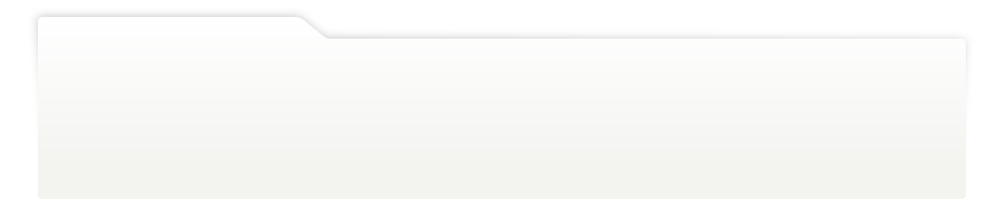
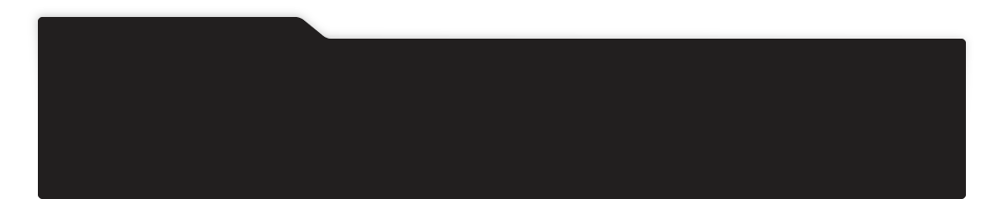
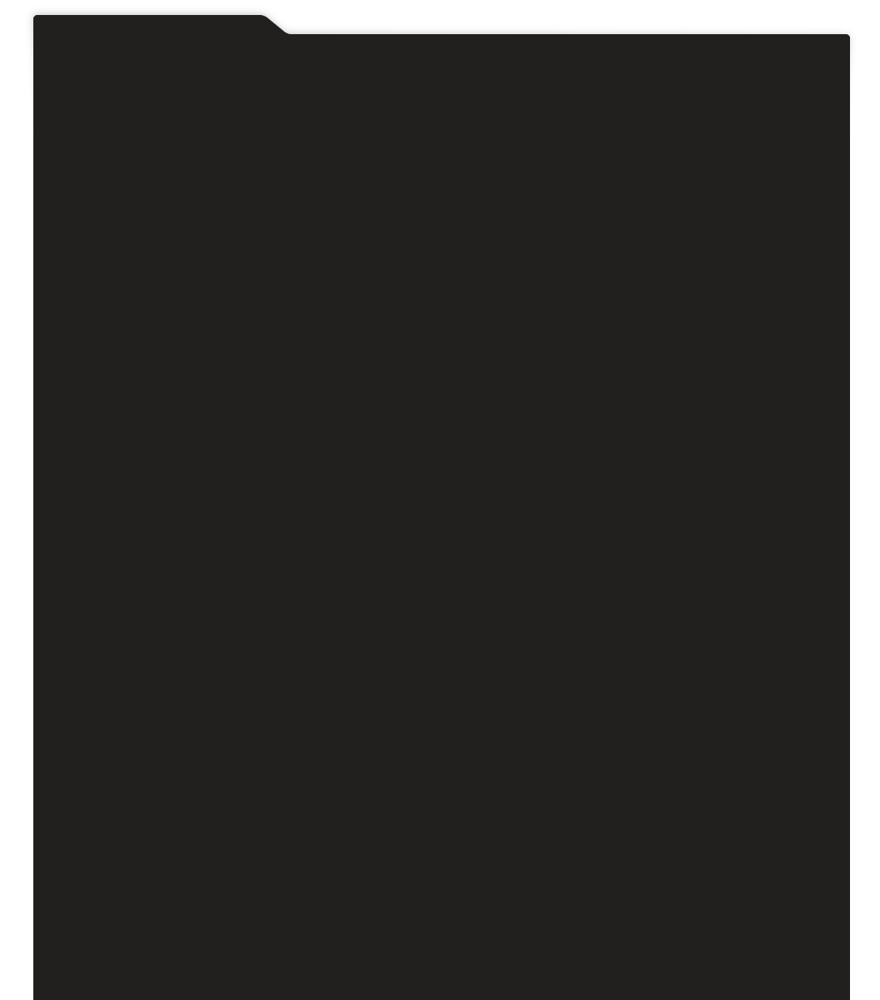
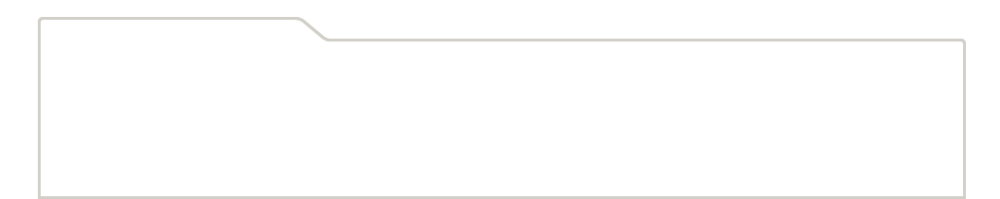
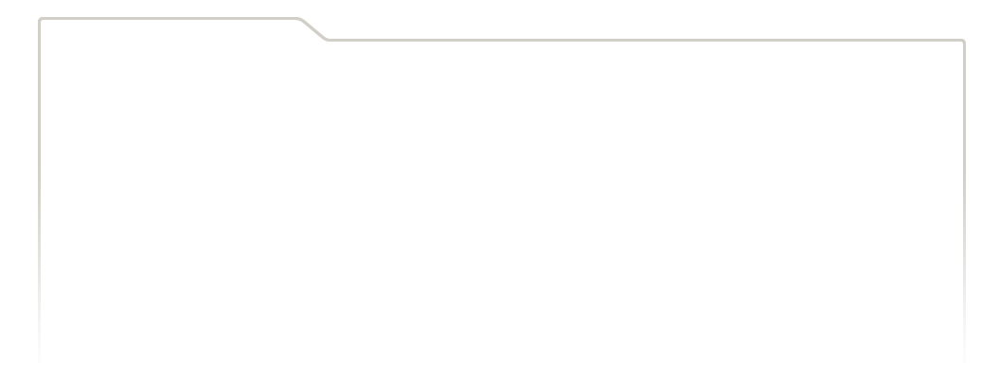
...
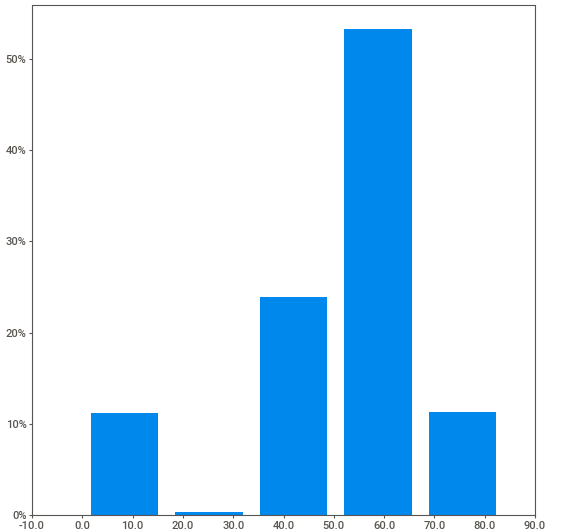
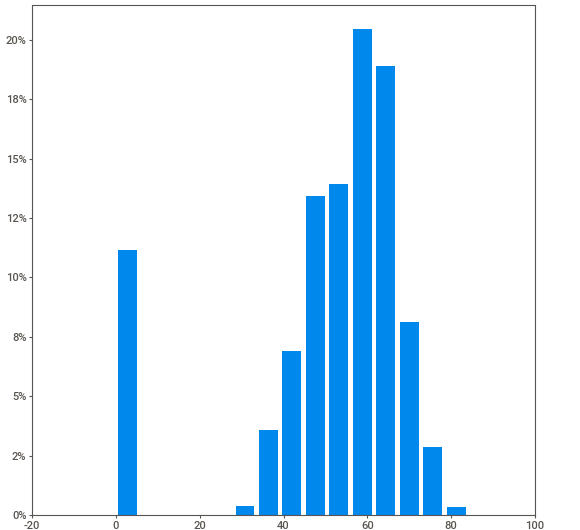
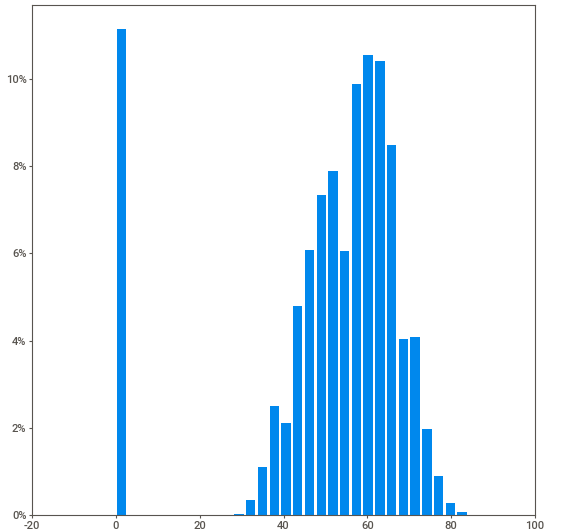
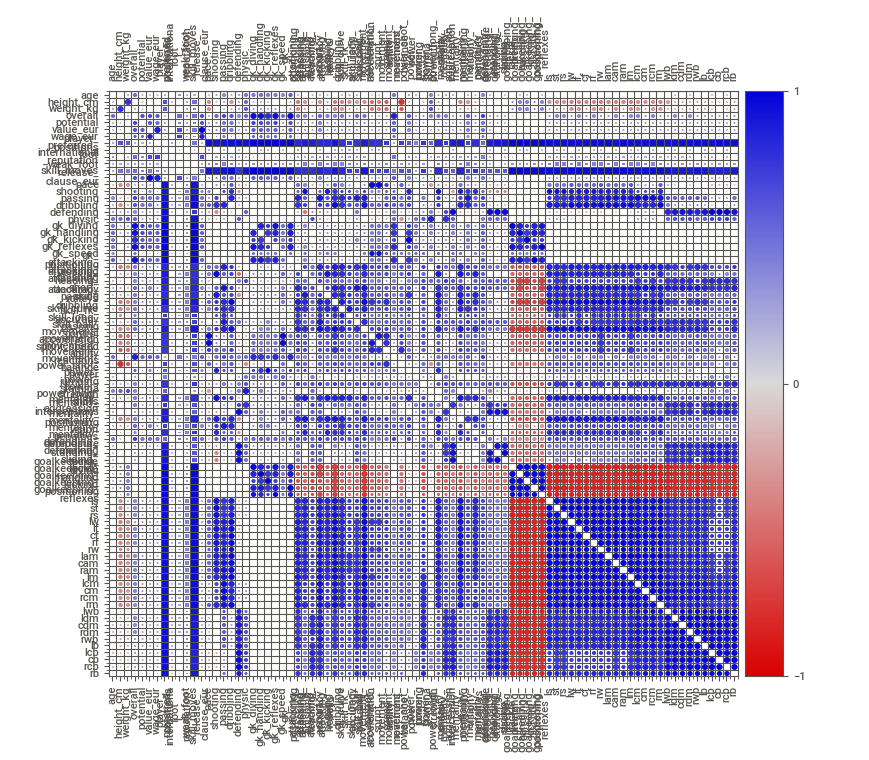
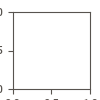

In [ ]:
my_report.show_notebook(layout='vertical')

##### Analysis Main Insights

1. Age
  - Min: 16
  - Max: 42
  - Average: 25.2
1. Height(cm)
  - Min: 156
  - Max: 205
  - Average: 181.3
1. Weight(kg)
  - Min: 50
  - Max: 110
  - Average: 75.2
1. Nationality
  - There are 162 distinct countries
  - Approx 9% players are from England
  - Approx 7% players are from Germany
  - Approx 6% players are from Spain
  - Remaining countries percent of players are 5% and below
1. Overall rating
  - Min: 48
  - Max: 94
  - Average: 66.2
  - 10 players are overall 90 and above
1. Potential rating
  - Min: 49
  - Max: 95
  - Average: 71.5
  - 39 players have a potential rating 90 and above
1. Player value in euros
  - Min: 0
  - Max: 105.5M
  - Average: 2.5M
1. Player wage in euros
  - Min: 0
  - Max: 565k
  - Average: 8k
1. Player Positions
  - 15 distinct positions
  - Approx 17% players are centre backs(CB)
  - Approx 14% players are strikers(ST)
  - Approx 12% players are centre midfield(CM)
  - Approx 11% players are goal keepers(GK)
1. Preferred Foot
  - Approx 76% players prefer the right foot
  - Approx 24% players prefer the left foot
1. International Reputation:
  - Approx 92% players have a rating of 1
  - Only 6 players in the entire dataset have a rating of 5
1. Weak foot
  - Rated between 1 and 5
  - Approx 62% players have rating of 3
  - Approx 1% players have a rating of 5
1. Skill moves
  - Rated between 1 and 5
  - Approx 47% players have rating of 2
  - Only 49 players in the entire dataset have a rating of 5
1. Player release clause in euros
  - Min: 0
  - Max: 195.8M
  - Average: 4.7M
1. Features representing ratings of skills such as pace, shooting, passing etc. are rated between 1 and 99. Distribution of ratings seem to be in a normal distribution.
1. Players with the GK position are only rated for the skills that associated with that position which are features prefixed by 'gk' or 'goalkeeping'.
1. Players with positions other than GK have no ratings for GK related skills.
1. The features in the list ['ls', 'st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm', 'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb'] indicate the players ability when playing in those positions and the rating ranges between 0 and 99.


##### Table displaying the total number of players for each position

In [ ]:
players_df = pd.DataFrame(data.groupby(['player_positions']).size().sort_values(ascending=False).reset_index().rename({0:'players_count'},axis=1))
players_df

,player_positions,players_count
0,CB,3162
1,ST,2582
2,CM,2193
3,GK,2036
4,CDM,1424
5,RB,1314
6,LB,1303
7,CAM,1146
8,RM,1050
9,LM,1049


#### Task 1: Top 10 countries with most players

In [ ]:
top_10_df = pd.DataFrame(data.groupby(['nationality']).size().sort_values(ascending=False).reset_index().rename({0:'players_count'},axis=1).head(10))
top_10_df

,nationality,players_count
0,England,1667
1,Germany,1216
2,Spain,1035
3,France,984
4,Argentina,886
5,Brazil,824
6,Italy,732
7,Colombia,591
8,Japan,453
9,Netherlands,416


From the table above we can observe that:
- The country with the most players is England
- England, Germany and Spain have more than a 1000 players each


#### Task 2: Overall Rating vs. Age of players Distribution

Text(0.5, 1.0, 'Overall Rating vs. Age of players')

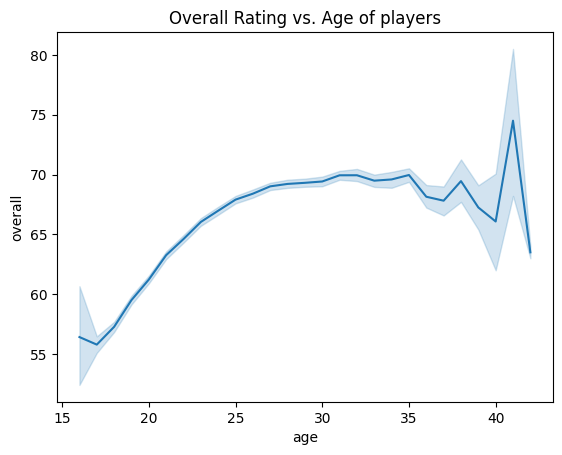

In [ ]:
sns.lineplot(data=data, x="age", y="overall").set_title("Overall Rating vs. Age of players")

From the graph above we can observe that:
- The overall rating of players gradually increases from the age of 16 to 25 years.
- From age 25 to 33 years the line is constant which indicates that players reach their best rating during this time.
- The rating to decrease from age 33 onwards.

#### Task 3: Which type of offensive player tends to get paid the most: the striker, the right-winger, or the left-winger?

In [ ]:
position_wage_df = pd.DataFrame(data.groupby('player_positions').mean().round(2)['wage_eur']
                                .sort_values(ascending=False).reset_index().rename({'wage_eur': 'average_wage_eur'}, axis=1))

position_wage_df.loc[position_wage_df['player_positions'].isin(['ST', 'LW', 'RW'])]

,player_positions,average_wage_eur
1,RW,15848.24
2,LW,14037.04
5,ST,10152.59


From the table above we can observe that:
- Right-winger players are paid the most with an average wage of approx 16000 euros
- Left-winger players are a close second with an average wage of approx 14000 euros
- Striker players are third and the lowest with an average wage of approx 10000 euros

### Feature Selection

In [7]:
data2 = data.copy()

In [ ]:
data2.shape

(18278, 104)

- The dataset contains 104 features in total.
- Reducing the number of features helps to remove irrelevant data and improve the performance of models.
- The number of features can be reduced by comparing their correlation with each other.


##### Correlation Heatmap to compare correlation of features

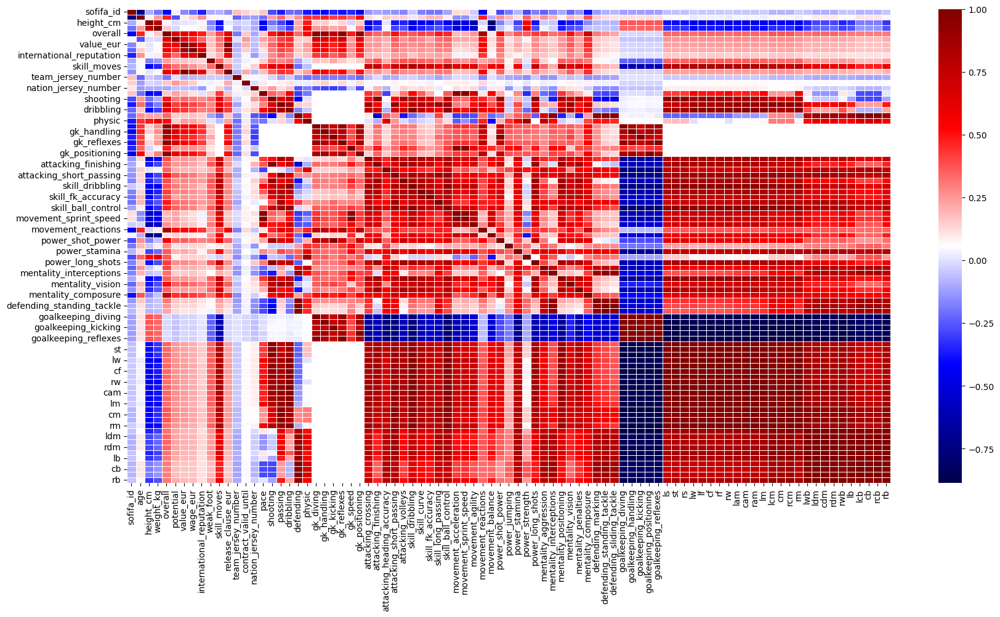

In [ ]:
plt.figure(figsize=(20,10))
sns.heatmap(data2.corr(numeric_only=True), linewidths=0.5, cmap='seismic')
plt.show()

Observations
- The goalkeeper features such as goalkeeping_diving, goalkeeping_handling etc. are higly correlated to each other as seen by the dark red squares.
- The goalkeeper features such as gk_diving, gk_handling etc. have no correlation with player skills features such as pace, shooting etc. as seen by the white squares.
- Goalkeepers can be assumed to be separate from the other player types and form their own cluster.
- We can remove the correlated features of goalkeepers to reduce multicollinearity.
- The position features 'ls', 'st', 'rs'... etc seem to have high correlation with each other and other features. We remove these features as they are redundant and do not provide any useful information.

##### Dropping Features

- The features below are dropped before doing further analysis.
- These features are dropped for following reasons:
  - Only unique values such as player id, short name, long name etc. are excluded as they do not provide useful information about the data.
  - Categorical features such as nationality, club, preferred foot etc. are excluded before PCA Analysis as PCA works with continuous data. Categorical data are discrete with zero variance, so including them in PCA would not bring any meaningful contribution and could also lead to incorrect results.
  - Additionally, the overall rating, potential rating, and international reputation rating features will also be dropped as these are not required for clustering since the aim is to cluster players based on their skills only. The features value, wage, and release clause in euros will also be removed for the same reason.

In [8]:
# remove features
drop_cols = [
    'sofifa_id', 'player_url', 'short_name', 'long_name', 'dob', 'nationality', 'club', 'player_positions', 'preferred_foot', 'international_reputation',
    'weak_foot', 'skill_moves', 'work_rate', 'body_type', 'real_face', 'player_tags', 'team_position', 'team_jersey_number', 'loaned_from', 'joined',
    'contract_valid_until', 'nation_position', 'nation_jersey_number', 'player_traits',
    'gk_handling','gk_reflexes','gk_positioning','gk_kicking','gk_speed','goalkeeping_diving','goalkeeping_handling','goalkeeping_kicking',
    'goalkeeping_positioning','goalkeeping_reflexes', 'overall', 'potential', 'value_eur', 'wage_eur', 'release_clause_eur',
    'ls', 'st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm', 'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb',
]

data2 = data2.drop(drop_cols, axis=1)

In [9]:
data2.shape

(18278, 39)

In [ ]:
data2.head()

,age,height_cm,weight_kg,pace,shooting,passing,dribbling,defending,physic,gk_diving,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle
0,32,170,72,87.0,92.0,92.0,96.0,39.0,66.0,NaN,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26
1,34,187,83,90.0,93.0,82.0,89.0,35.0,78.0,NaN,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24
2,27,175,68,91.0,85.0,87.0,95.0,32.0,58.0,NaN,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29
3,26,188,87,NaN,NaN,NaN,NaN,NaN,NaN,87.0,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18
4,28,175,74,91.0,83.0,86.0,94.0,35.0,66.0,NaN,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22


##### Compare Correlation of Features Once More to Find and Remove Higly Correlated Features

Since we still have 39 features, we shall compare their correlations again to see if any more features may be dropped.

- Highly correlated features must be removed from the dataset for the following reasons:
  - Redundancy as these features provide the same information.
  - Multicollinearity in the data impacts the performance of the machine learning model, making it more sensitive to small changes in the data and less reliable.
  - Removing the correlated features can make the training time of models faster.
  - Removing the correlated features makes the model more interpretable and easier to understand the importance of individual features.

- We shall use the threshold of 0.9 to identify if multicollinearity is present between any two features.

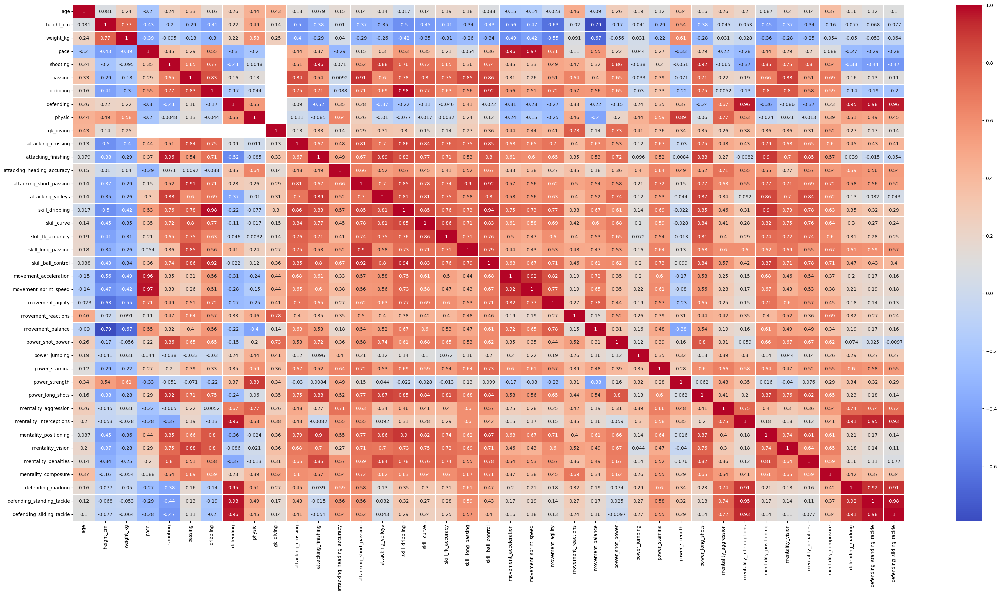

In [ ]:
plt.figure(figsize=(40,20))
sns.heatmap(data2.corr(numeric_only=True), linewidths=0.5, cmap='coolwarm', annot=True)
plt.show()

In [ ]:
corr_matrix = data2.corr()
corr_matrix = corr_matrix.abs().unstack().sort_values(ascending=False)
corr_matrix = pd.DataFrame(corr_matrix).reset_index()
corr_matrix.columns = ['feature1','feature2','pairwise_correlation']
positive_corr_matrix = corr_matrix.loc[(corr_matrix['pairwise_correlation'] < 1) & (corr_matrix['pairwise_correlation'] > 0.9)]
negative_corr_matrix = corr_matrix.loc[(corr_matrix['pairwise_correlation'] > -1) & (corr_matrix['pairwise_correlation'] < -0.9)]

In [ ]:
positive_corr_matrix.sort_values(['feature1', 'pairwise_correlation'], ascending=[True, False])

,feature1,feature2,pairwise_correlation
47,attacking_finishing,shooting,0.963129
71,attacking_short_passing,skill_ball_control,0.917721
73,attacking_short_passing,passing,0.909663
44,defending,defending_standing_tackle,0.975573
52,defending,mentality_interceptions,0.961099
54,defending,defending_sliding_tackle,0.959532
56,defending,defending_marking,0.952215
55,defending_marking,defending,0.952215
69,defending_marking,defending_standing_tackle,0.918593
75,defending_marking,defending_sliding_tackle,0.909153


In [ ]:
negative_corr_matrix

,feature1,feature2,pairwise_correlation


##### Dropping Correlated Features

- The features below will be dropped due to high multicollinearity with other features.

In [10]:
drop_correlated_cols = [
    'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic', 'movement_acceleration', 'defending_standing_tackle', 'skill_dribbling', 'attacking_short_passing',
    'defending_sliding_tackle', 'defending_marking',
]

data2 = data2.drop(drop_correlated_cols, axis=1)

In [11]:
data2.shape

(18278, 27)

### Feature Scaling

- PCA requires data to be normalized with mean of zero and unit variance.
- We shall scale the data using standard scaling.
- Before the scaling is done, any missing values in the data is dealt with.

#### Handle Missing Values

In [12]:
data2.isnull().sum()

age                               0
height_cm                         0
weight_kg                         0
gk_diving                     16242
attacking_crossing                0
attacking_finishing               0
attacking_heading_accuracy        0
attacking_volleys                 0
skill_curve                       0
skill_fk_accuracy                 0
skill_long_passing                0
skill_ball_control                0
movement_sprint_speed             0
movement_agility                  0
movement_reactions                0
movement_balance                  0
power_shot_power                  0
power_jumping                     0
power_stamina                     0
power_strength                    0
power_long_shots                  0
mentality_aggression              0
mentality_interceptions           0
mentality_positioning             0
mentality_vision                  0
mentality_penalties               0
mentality_composure               0
dtype: int64

From the null values we can observe that:
- The gk_diving feature has 16242 missing values.
- We know that 2036 is the number of goalkeepers in the dataset, so this means the players who play positions other than goalkeeper have no rating for this feature.
- We can set these missing values to zero as the values are actually zero in these instances.

In [13]:
data2 = data2.fillna(0, axis=1)

In [14]:
data2.isnull().sum()

age                           0
height_cm                     0
weight_kg                     0
gk_diving                     0
attacking_crossing            0
attacking_finishing           0
attacking_heading_accuracy    0
attacking_volleys             0
skill_curve                   0
skill_fk_accuracy             0
skill_long_passing            0
skill_ball_control            0
movement_sprint_speed         0
movement_agility              0
movement_reactions            0
movement_balance              0
power_shot_power              0
power_jumping                 0
power_stamina                 0
power_strength                0
power_long_shots              0
mentality_aggression          0
mentality_interceptions       0
mentality_positioning         0
mentality_vision              0
mentality_penalties           0
mentality_composure           0
dtype: int64

In [15]:
data2.describe()

,age,height_cm,weight_kg,gk_diving,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_volleys,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure
count,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000
mean,25.283291,181.362184,75.276343,7.287449,49.718405,45.590218,52.221468,42.809388,47.325692,42.708885,52.768848,58.461976,64.415746,63.504924,61.752544,63.856439,58.181694,64.928165,62.889485,65.234763,46.812945,55.742149,46.380239,50.072163,53.609749,48.383357,58.528778
std,4.656964,6.756961,7.047744,20.744698,18.325403,19.594609,17.428429,17.701815,18.422991,17.433612,15.246454,16.741878,14.847763,14.808380,9.135613,14.201559,13.326083,11.934059,16.017954,12.534811,19.322343,17.318157,20.775812,19.594022,13.955626,15.708099,11.880840
min,16.000000,156.000000,50.000000,0.000000,5.000000,2.000000,5.000000,3.000000,6.000000,4.000000,8.000000,5.000000,11.000000,11.000000,21.000000,12.000000,14.000000,19.000000,12.000000,20.000000,4.000000,9.000000,3.000000,2.000000,9.000000,7.000000,12.000000
25%,22.000000,177.000000,70.000000,0.000000,38.000000,30.000000,44.000000,30.000000,34.000000,31.000000,43.000000,54.000000,57.000000,55.000000,56.000000,56.000000,48.000000,58.000000,56.000000,58.000000,32.000000,44.000000,25.000000,39.000000,44.000000,39.000000,51.000000
50%,25.000000,181.000000,75.000000,0.000000,54.000000,49.000000,56.000000,44.000000,49.000000,41.000000,56.000000,63.000000,67.000000,66.000000,62.000000,66.000000,59.000000,66.000000,66.000000,66.000000,51.000000,58.000000,52.000000,55.000000,55.000000,49.000000,60.000000
75%,29.000000,186.000000,80.000000,0.000000,64.000000,62.000000,64.000000,56.000000,62.000000,56.000000,64.000000,69.000000,75.000000,74.000000,68.000000,74.000000,68.000000,73.000000,74.000000,74.000000,62.000000,69.000000,64.000000,64.000000,64.000000,60.000000,67.000000
max,42.000000,205.000000,110.000000,90.000000,93.000000,95.000000,93.000000,90.000000,94.000000,94.000000,92.000000,96.000000,96.000000,96.000000,96.000000,97.000000,95.000000,95.000000,97.000000,97.000000,94.000000,95.000000,92.000000,95.000000,94.000000,92.000000,96.000000


In [16]:
std_scaler = StandardScaler()

scaled_df = std_scaler.fit_transform(data2)
scaled_df = pd.DataFrame(scaled_df, columns=data2.columns)

In [17]:
scaled_df.describe()

,age,height_cm,weight_kg,gk_diving,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_volleys,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure
count,1.827800e+04,1.827800e+04,1.827800e+04,1.827800e+04,1.827800e+04,1.827800e+04,1.827800e+04,1.827800e+04,1.827800e+04,1.827800e+04,1.827800e+04,1.827800e+04,1.827800e+04,1.827800e+04,1.827800e+04,1.827800e+04,1.827800e+04,1.827800e+04,1.827800e+04,1.827800e+04,1.827800e+04,1.827800e+04,1.827800e+04,1.827800e+04,1.827800e+04,1.827800e+04,1.827800e+04
mean,2.736744e-16,1.855077e-15,-4.975898e-17,-2.487949e-17,6.219873e-17,-8.707822e-17,-1.741564e-16,-1.368372e-16,-1.243975e-17,-6.219873e-17,-1.865962e-16,7.463848e-17,-2.550148e-16,2.487949e-17,1.243975e-16,3.109936e-18,3.731924e-17,5.286892e-16,-1.617167e-16,4.353911e-16,-1.243975e-17,-3.731924e-17,-6.219873e-17,-7.463848e-17,-1.368372e-16,4.975898e-17,-4.975898e-17
std,1.000027e+00,1.000027e+00,1.000027e+00,1.000027e+00,1.000027e+00,1.000027e+00,1.000027e+00,1.000027e+00,1.000027e+00,1.000027e+00,1.000027e+00,1.000027e+00,1.000027e+00,1.000027e+00,1.000027e+00,1.000027e+00,1.000027e+00,1.000027e+00,1.000027e+00,1.000027e+00,1.000027e+00,1.000027e+00,1.000027e+00,1.000027e+00,1.000027e+00,1.000027e+00,1.000027e+00
min,-1.993476e+00,-3.753592e+00,-3.586543e+00,-3.513018e-01,-2.440308e+00,-2.224663e+00,-2.709525e+00,-2.248949e+00,-2.243220e+00,-2.220420e+00,-2.936425e+00,-3.193396e+00,-3.597660e+00,-3.545719e+00,-4.460966e+00,-3.651561e+00,-3.315521e+00,-3.848600e+00,-3.177115e+00,-3.608830e+00,-2.215783e+00,-2.699099e+00,-2.088074e+00,-2.453477e+00,-3.196630e+00,-2.634596e+00,-3.916394e+00
25%,-7.050475e-01,-6.456014e-01,-7.486776e-01,-3.513018e-01,-6.394798e-01,-7.956599e-01,-4.717403e-01,-7.236398e-01,-7.233384e-01,-6.716454e-01,-6.407467e-01,-2.665232e-01,-4.994657e-01,-5.743475e-01,-6.297007e-01,-5.532248e-01,-7.640634e-01,-5.805531e-01,-4.301219e-01,-5.771895e-01,-7.666436e-01,-6.780439e-01,-1.029121e+00,-5.650941e-01,-6.886121e-01,-5.973742e-01,-6.337080e-01
50%,-6.083343e-02,-5.360308e-02,-3.921123e-02,-3.513018e-01,2.336490e-01,1.740211e-01,2.168087e-01,6.726114e-02,9.088393e-02,-9.802511e-02,2.119339e-01,2.710656e-01,1.740548e-01,1.684954e-01,2.708770e-02,1.509425e-01,6.140803e-02,8.981557e-02,1.941946e-01,6.105061e-02,2.167009e-01,1.303783e-01,2.705028e-01,2.515038e-01,9.962209e-02,3.925745e-02,1.238349e-01
75%,7.981187e-01,6.863948e-01,6.702551e-01,-3.513018e-01,7.793545e-01,8.374870e-01,6.758414e-01,7.451763e-01,7.965433e-01,7.624053e-01,7.366604e-01,6.294582e-01,7.128713e-01,7.087448e-01,6.838761e-01,7.142764e-01,7.367938e-01,6.763881e-01,6.936478e-01,6.992907e-01,7.860057e-01,7.655672e-01,8.481133e-01,7.108402e-01,7.445409e-01,7.395523e-01,7.130349e-01
max,3.589713e+00,3.498387e+00,4.927053e+00,3.987275e+00,2.361900e+00,2.521670e+00,2.339835e+00,2.665936e+00,2.533551e+00,2.942162e+00,2.573203e+00,2.242225e+00,2.127264e+00,2.194431e+00,3.748889e+00,2.333861e+00,2.762951e+00,2.519902e+00,2.129576e+00,2.534231e+00,2.442165e+00,2.266923e+00,2.195871e+00,2.292999e+00,2.894270e+00,2.776774e+00,3.154006e+00


## PCA Analysis

- PCA will be used to reduce the dimensionality of the dataset.
- Benefits of using PCA:
  - Reduced model training time
  - Reduced overfitting
- When using PCA the explained variance threshold must be chosen carefully to avoid information loss.

In [18]:
scaled_df.shape

(18278, 27)

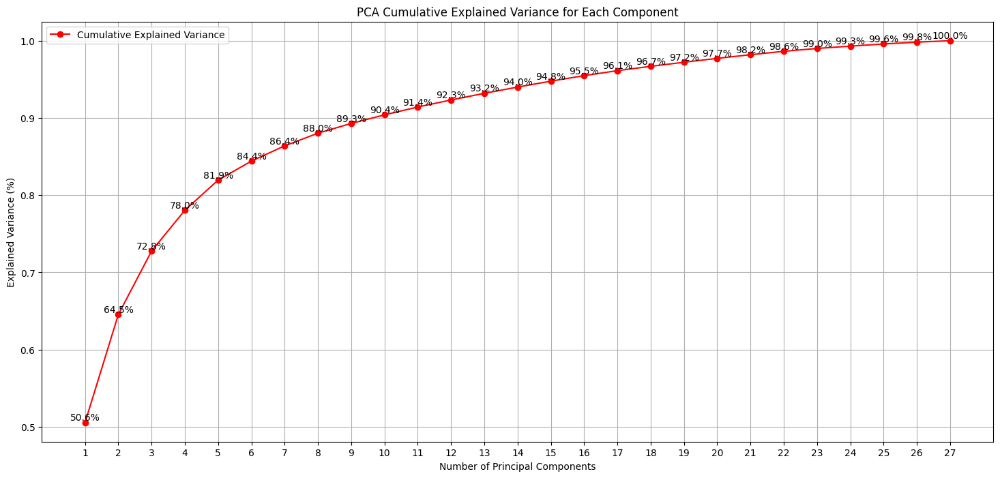

In [ ]:
pca = PCA()

pc_components = pca.fit_transform(scaled_df)

cumulative_variances = np.cumsum(pca.explained_variance_ratio_)

plt.figure(figsize=(18,8))

num_ticks=len(scaled_df.columns)+1

line = plt.plot(range(1, num_ticks), cumulative_variances, marker='o', color='r', label='Cumulative Explained Variance')

for i, cum_val in enumerate(cumulative_variances):
    plt.text(i+1, cum_val, f'{cum_val*100:.1f}%', ha='center', va='bottom')

plt.xlabel('Number of Principal Components')
plt.ylabel('Explained Variance (%)')
plt.title('PCA Cumulative Explained Variance for Each Component')
plt.legend(loc='upper left')
plt.grid(True)
plt.xticks(range(1, num_ticks))
plt.show()

- From the above graph we see that the first 10 components explain approximately 90% of the variance in the data and the first 16 componenets explain approximately 95.5% of the variance in the data.
- We shall use 16 pca components for clustering.

## Clustering

In [19]:
num_features=16
pca = PCA(n_components=num_features)
pca_data = pca.fit_transform(scaled_df)

principal_df = pd.DataFrame(data=pca_data, columns=[f'principal_component_{i+1}' for i in range(num_features)])

In [20]:
principal_df.head()

,principal_component_1,principal_component_2,principal_component_3,principal_component_4,principal_component_5,principal_component_6,principal_component_7,principal_component_8,principal_component_9,principal_component_10,principal_component_11,principal_component_12,principal_component_13,principal_component_14,principal_component_15,principal_component_16
0,-9.496111,0.335997,3.236524,-2.179349,-0.650305,-0.719249,-0.049323,0.717726,-0.965684,-0.092779,0.537169,-0.728115,0.311414,-1.000519,-0.238788,-0.049854
1,-8.614896,-2.923991,3.497879,-0.150641,-2.819663,-0.940001,-0.185809,0.378358,-1.271113,0.265086,-0.419235,0.268904,-0.042951,-0.146540,-0.569387,-0.028636
2,-8.631939,1.402708,2.832384,-1.448348,-0.172298,-1.298544,-0.169180,1.336736,-1.326139,0.485134,-0.278546,-0.423979,0.473357,0.317007,-0.267950,0.451636
3,5.636840,-1.623379,2.445452,-3.357632,-2.757508,-3.543404,-0.378838,0.250719,0.154479,-0.479912,0.509911,-0.137353,0.169862,-0.266976,0.470404,0.613045
4,-8.261016,0.674077,2.659711,-1.290899,-0.128447,-1.455433,0.495268,1.091199,-0.573779,0.092798,0.583727,-0.959691,0.264425,-0.072381,-0.463310,0.579971


In [21]:
principal_df.shape

(18278, 16)

### K-Means Clustering

- KMeans clustering algorithm is used to cluster the dataset.
- The optimal number of clusters will be determined using the Elbow Method and the Silhouette Score.

#### Elbow Method

- The elbow method is used to determine the optimal number of clusters by plotting the Within-Cluster Sum of Squared distances of samples to their closest cluster center.
- The variance explained by each cluster can be analysed and an 'elbow' point can be identified where the plotted line that is decreasing becomes steady, suggesting that adding more clusters wont improve the clustering of the data.  

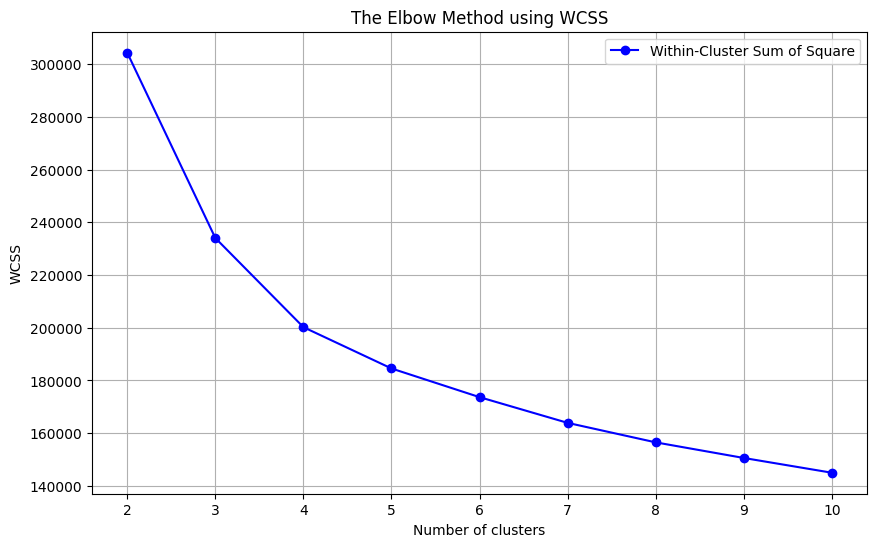

In [ ]:
kmeans = KMeans()
wcss = []

for i in range(2,11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans = kmeans.fit(principal_df)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(10,6))
plt.plot(range(2,11), wcss, marker='o', color='b', label='Within-Cluster Sum of Square')
plt.title('The Elbow Method using WCSS')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.legend(loc='upper right')
plt.grid(True)
plt.xticks(range(2, 11))
plt.show()

- The elbow from the above graph appears to be at 4 clusters.
- Since the elbow point is not very sharp, we shall confirm the number of clusters using the Silhouette score.

#### Silhouette Score Analysis

- The Silhoutte Score is calculated using the following formula:
$$ (b - a) / max(a, b) $$
where a is the mean intra-cluster distance and b is the mean nearest-cluster distance.
- The score ranges from [-1, 1] where:
  - +1 is the best value
  - -1 is the worst value (negative values indicate sample is assigned to the wrong cluster)
  - 0 indicates overlapping clusters

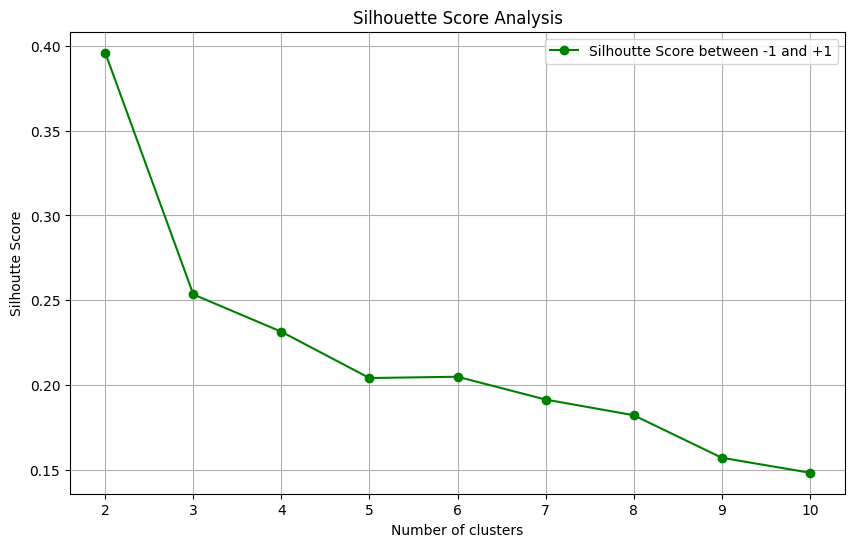

In [ ]:
kmeans = KMeans()
silhouette_scores_list = []

for i in range(2,11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans = kmeans.fit(principal_df)
    cluster_labels = kmeans.labels_
    silhouette_scores_list.append(silhouette_score(principal_df, cluster_labels))

plt.figure(figsize=(10,6))
plt.plot(range(2,11), silhouette_scores_list, marker='o', color='g', label='Silhoutte Score between -1 and +1')
plt.title('Silhouette Score Analysis')
plt.xlabel('Number of clusters')
plt.ylabel('Silhoutte Score')
plt.legend(loc='upper right')
plt.grid(True)
plt.xticks(range(2, 11))
plt.show()

- From the Elbow Method and Silhouette Score analysis, we can observe that the optimal number of clusters is 4.
- We shall use this number to cluster the data.

#### Clustering with chosen number of clusters

In [22]:
# initialize with the chosen number of clusters
k = 4
kmeans = KMeans(n_clusters=k, random_state=42)

# get predictions and store into the dataset to visualize the clusters
y_pred = kmeans.fit_predict(principal_df)
cluster_centers = kmeans.cluster_centers_

kmeans_df = principal_df.copy()
kmeans_df['cluster'] = pd.DataFrame(y_pred)
kmeans_df.head()

,principal_component_1,principal_component_2,principal_component_3,principal_component_4,principal_component_5,principal_component_6,principal_component_7,principal_component_8,principal_component_9,principal_component_10,principal_component_11,principal_component_12,principal_component_13,principal_component_14,principal_component_15,principal_component_16,cluster
0,-9.496111,0.335997,3.236524,-2.179349,-0.650305,-0.719249,-0.049323,0.717726,-0.965684,-0.092779,0.537169,-0.728115,0.311414,-1.000519,-0.238788,-0.049854,0
1,-8.614896,-2.923991,3.497879,-0.150641,-2.819663,-0.940001,-0.185809,0.378358,-1.271113,0.265086,-0.419235,0.268904,-0.042951,-0.146540,-0.569387,-0.028636,0
2,-8.631939,1.402708,2.832384,-1.448348,-0.172298,-1.298544,-0.169180,1.336736,-1.326139,0.485134,-0.278546,-0.423979,0.473357,0.317007,-0.267950,0.451636,0
3,5.636840,-1.623379,2.445452,-3.357632,-2.757508,-3.543404,-0.378838,0.250719,0.154479,-0.479912,0.509911,-0.137353,0.169862,-0.266976,0.470404,0.613045,1
4,-8.261016,0.674077,2.659711,-1.290899,-0.128447,-1.455433,0.495268,1.091199,-0.573779,0.092798,0.583727,-0.959691,0.264425,-0.072381,-0.463310,0.579971,0


Text(0.5, 1.0, 'Clusters on PCA Data - Centroids Marked by Black Cross')

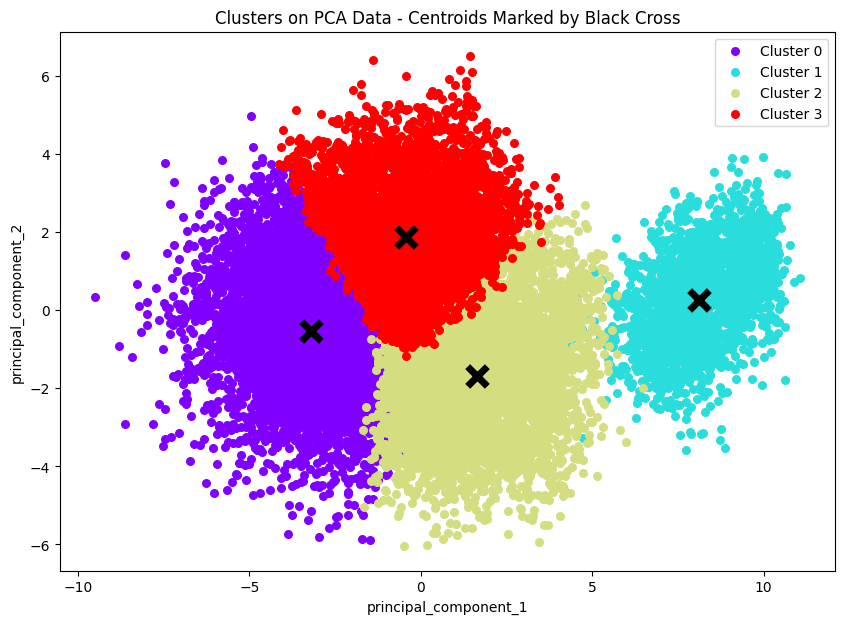

In [23]:
# visualize the clusters and cluster centroids
fig, ax = plt.subplots(figsize = (10,7))

cmap = cm.get_cmap('rainbow')

for i, cluster in kmeans_df.groupby('cluster'):
  cluster.plot(ax = ax, kind = 'scatter', x = 'principal_component_1', y = 'principal_component_2',
               color = cmap((i)*1.0/(len(cluster_centers)-1)), label = 'Cluster %i'%(i), s=30)

for i, c in enumerate(cluster_centers):
      ax.scatter(x = c[0], y = c[1], color = 'black', edgecolors = 'black', linewidth = 5, marker = 'x', s=200)

ax.set_title("Clusters on PCA Data - Centroids Marked by Black Cross")

##### Cluster Analysis

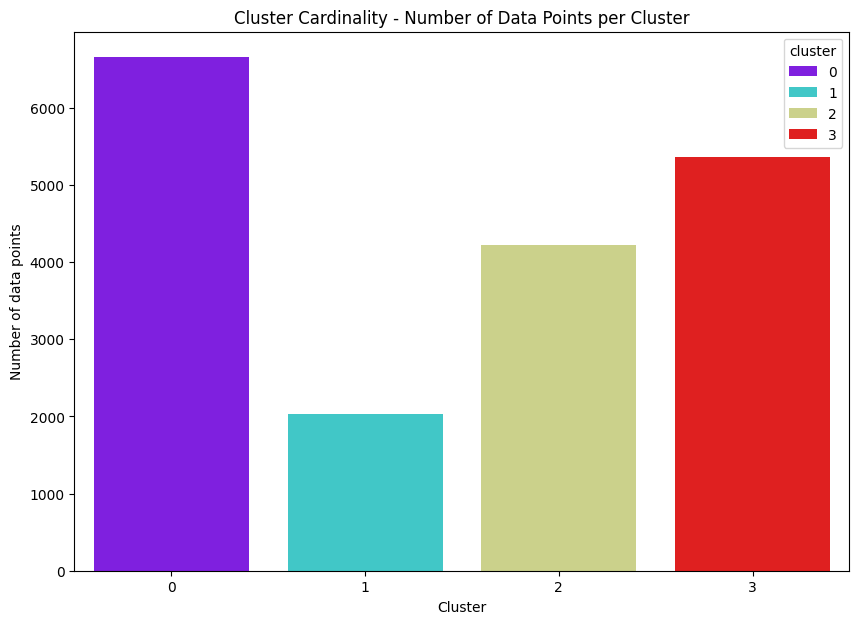

In [27]:
plt.figure(figsize = (10,7))
sns.countplot(kmeans_df, x='cluster', hue='cluster', palette=cmap).set_title('Cluster Cardinality - Number of Data Points per Cluster')
plt.ylabel('Number of data points')
plt.xlabel('Cluster')
plt.show()

---